In [27]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import nltk # text processing
from nltk.stem import PorterStemmer # text processing
from nltk.corpus import stopwords #text processing
import numpy as np # one-hot vector
from sklearn.model_selection import train_test_split
from itertools import chain # feature construction
from collections import Counter # build feats-dict

## Load dataset

In [2]:
df = pd.read_excel('final_dataset.xlsx')

In [3]:
df.head()

,Industry,CompName,year,filename,sentence_id,team,day,sentence,labels
0,Energy,CHEVRON CORP,2002,CHEVRON CORP_2002.txt,8,1,1,Product Stewardship Manage potential risks of ...,PL
1,Energy,CHEVRON CORP,2002,CHEVRON CORP_2002.txt,10,1,1,CNL and UNDP will develop a coordinated master...,CR
2,Energy,CHEVRON CORP,2003,CHEVRON CORP_2003.txt,30,1,1,ChevronTexaco continues to advocate for consis...,CC
3,Energy,CHEVRON CORP,2004,CHEVRON CORP_2004.txt,38,1,1,"Maturing oil fields, more technically challeng...",NC
4,Energy,CHEVRON CORP,2004,CHEVRON CORP_2004.txt,41,1,1,We found that units in which employees rated t...,HC


## EDA

In [4]:
df.shape

(4500, 9)

**Observation: 4500 rows of data**

In [5]:
df = df.iloc[:, 7:9]
df.head()

,sentence,labels
0,Product Stewardship Manage potential risks of ...,PL
1,CNL and UNDP will develop a coordinated master...,CR
2,ChevronTexaco continues to advocate for consis...,CC
3,"Maturing oil fields, more technically challeng...",NC
4,We found that units in which employees rated t...,HC


In [6]:
df.labels.unique()

array(['PL', 'CR', 'CC', 'NC', 'HC', 'BE', 'PW', 'CG', 'N'], dtype=object)

**Observation: labels ['PL', 'CR', 'CC', 'NC', 'HC', 'BE', 'PW', 'CG', 'N']**

In [7]:
labels = ['PL', 'CR', 'CC', 'NC', 'HC', 'BE', 'PW', 'CG', 'N']

<AxesSubplot:>

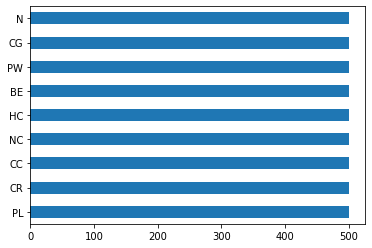

In [8]:
df.labels.value_counts().sort_values().plot(kind="barh")

**Observation: balanced data**

## Word Cloud

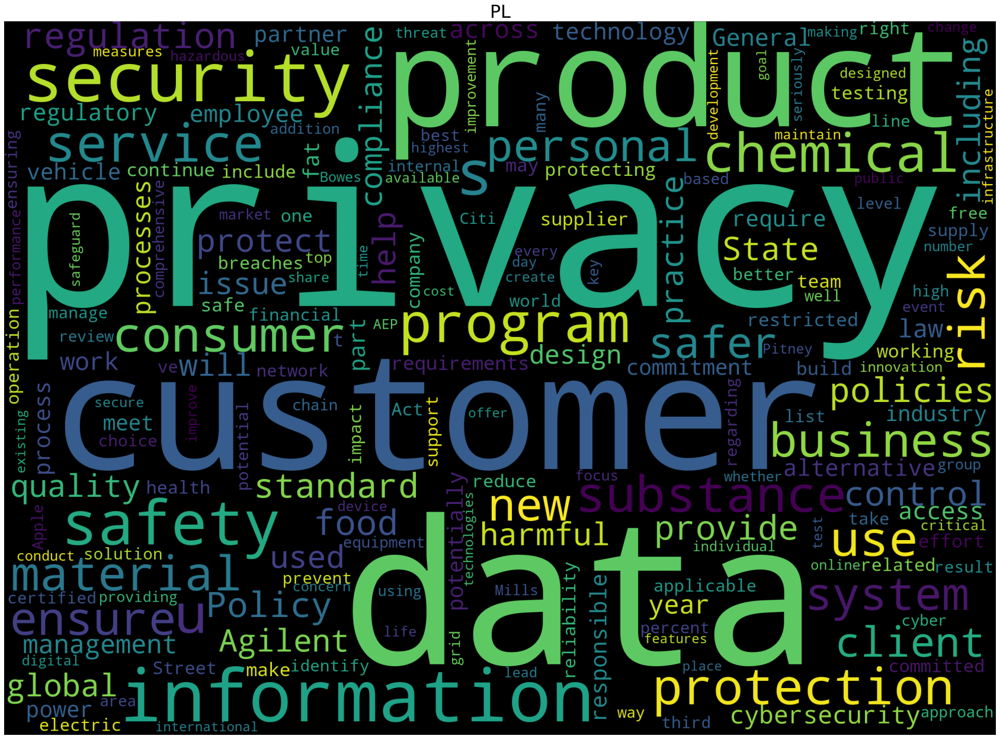

In [9]:
plt.figure(figsize=(30,25))
# PL
subset = df[df.labels=='PL']
text = subset['sentence']
cloud_PL = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("PL",fontsize=30)
plt.imshow(cloud_PL)

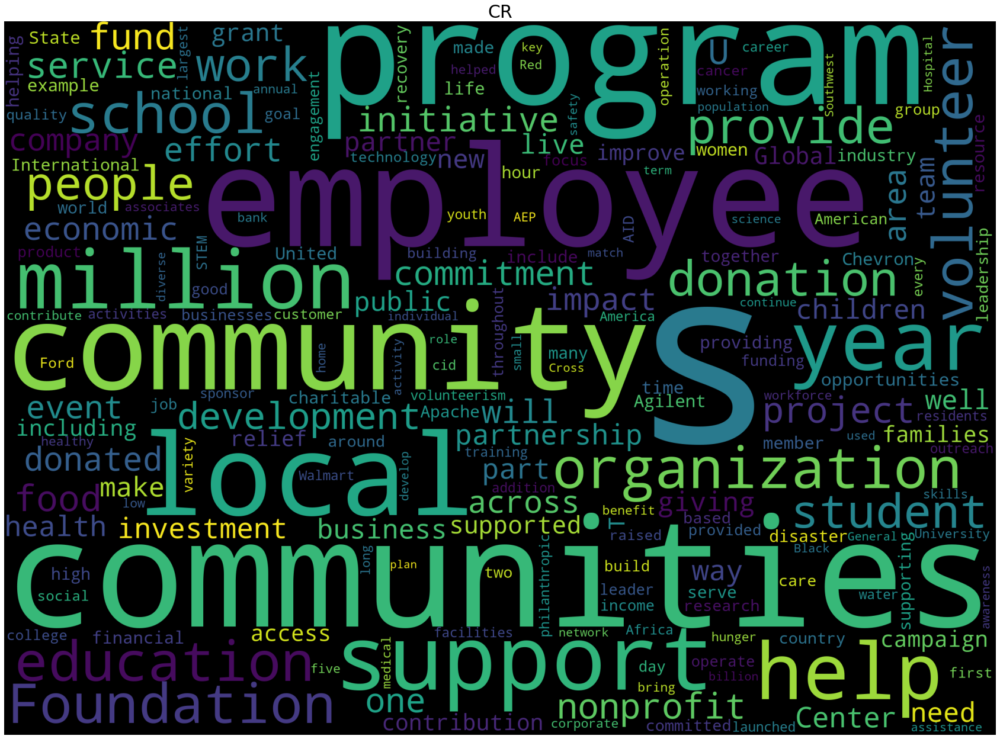

In [10]:
plt.figure(figsize=(30,25))
# CR
subset = df[df.labels=='CR']
text = subset['sentence']
cloud_CR = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("CR",fontsize=30)
plt.imshow(cloud_CR)

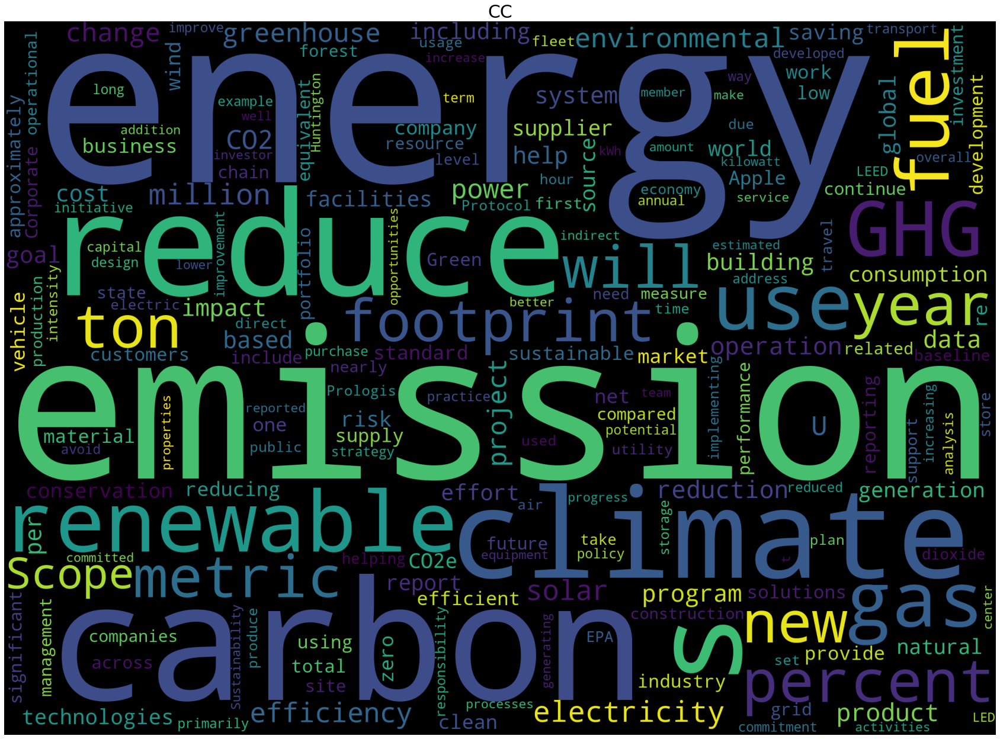

In [11]:
plt.figure(figsize=(30,25))
# CC
subset = df[df.labels=='CC']
text = subset['sentence']
cloud_CC = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("CC",fontsize=30)
plt.imshow(cloud_CC)

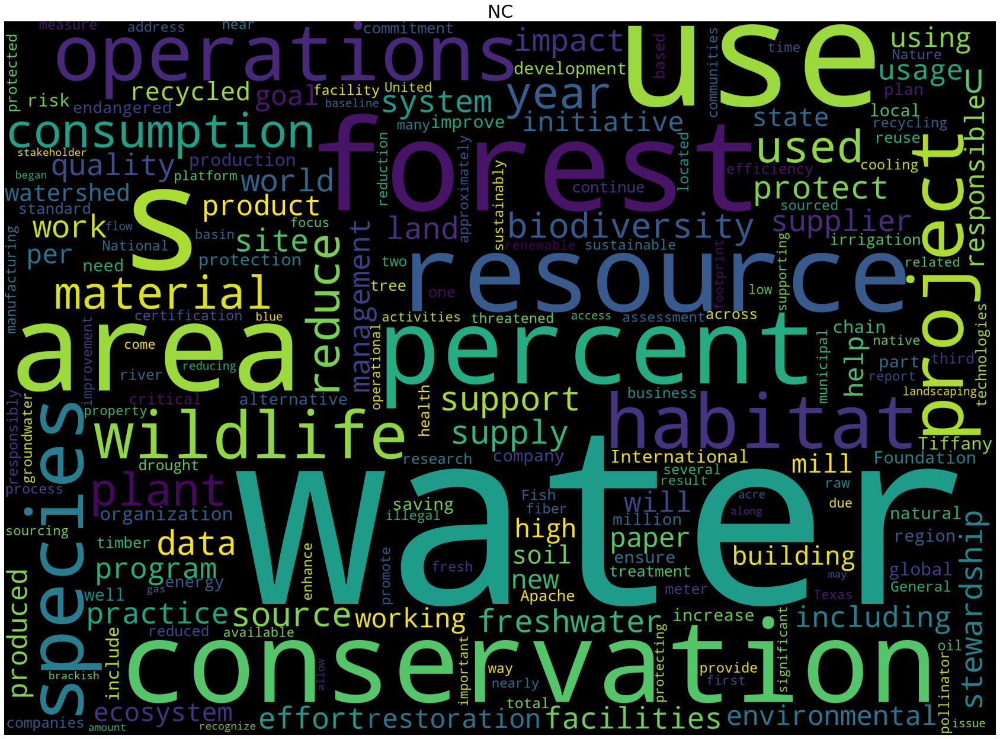

In [12]:
plt.figure(figsize=(30,25))
# NC
subset = df[df.labels=='NC']
text = subset['sentence']
cloud_NC = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("NC",fontsize=30)
plt.imshow(cloud_NC)

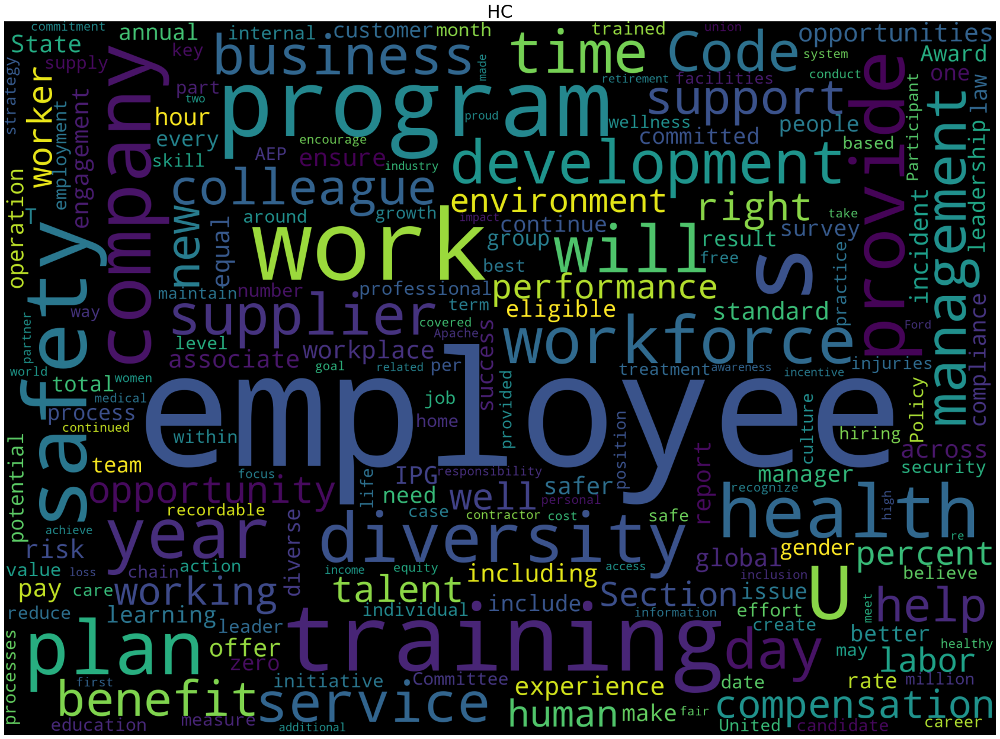

In [13]:
plt.figure(figsize=(30,25))
# HC
subset = df[df.labels=='HC']
text = subset['sentence']
cloud_HC = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("HC",fontsize=30)
plt.imshow(cloud_HC)

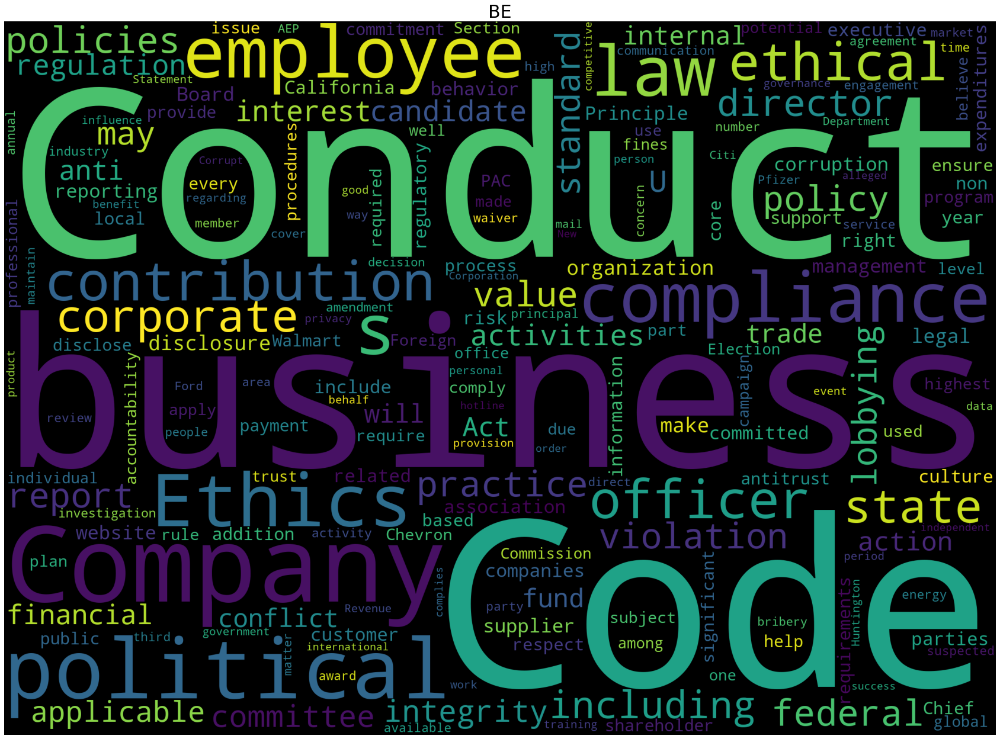

In [14]:
plt.figure(figsize=(30,25))
# BE
subset = df[df.labels=='BE']
text = subset['sentence']
cloud_BE = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("BE",fontsize=30)
plt.imshow(cloud_BE)

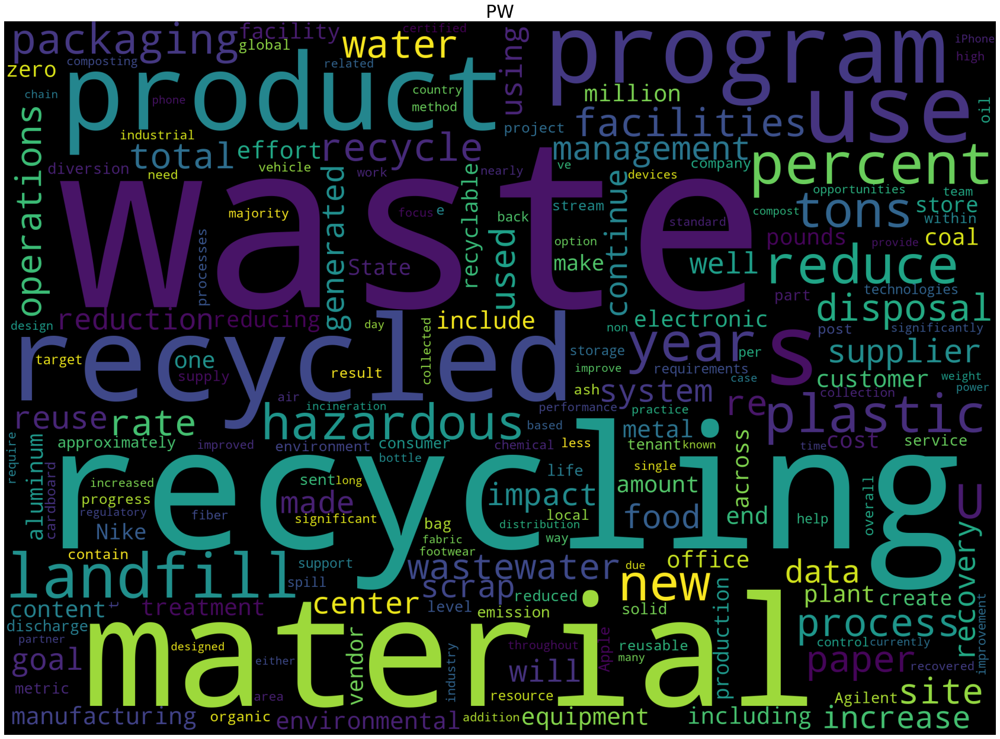

In [15]:
plt.figure(figsize=(30,25))
# PW
subset = df[df.labels=='PW']
text = subset['sentence']
cloud_PW = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("PW",fontsize=30)
plt.imshow(cloud_PW)

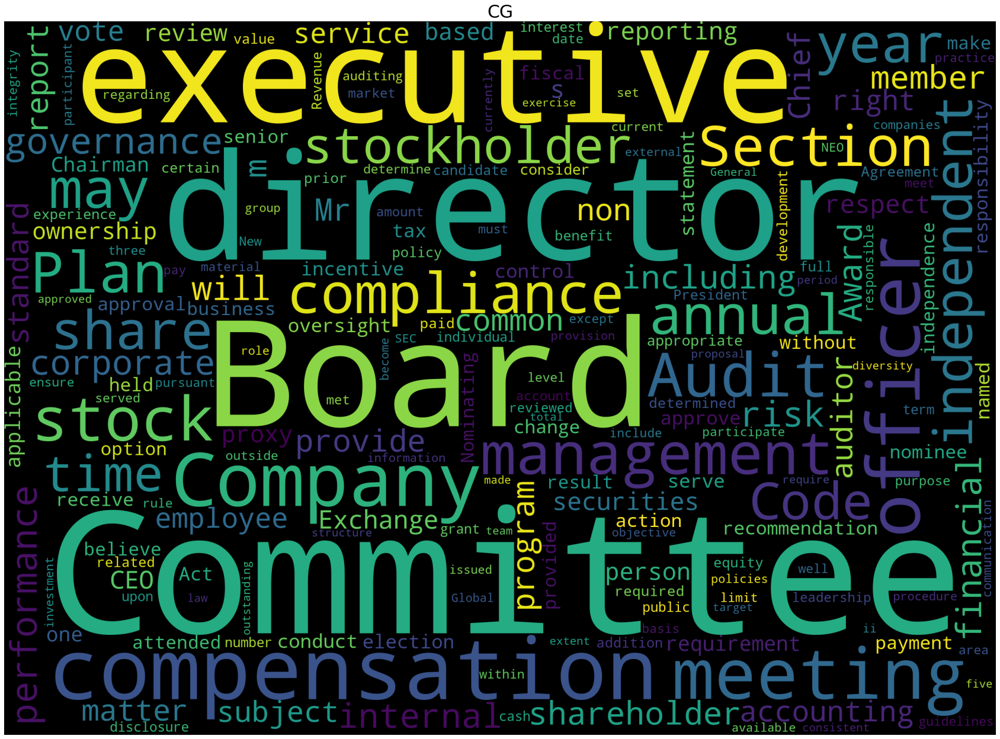

In [16]:
plt.figure(figsize=(30,25))
# CG
subset = df[df.labels=='CG']
text = subset['sentence']
cloud_CG = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("CG",fontsize=30)
plt.imshow(cloud_CG)

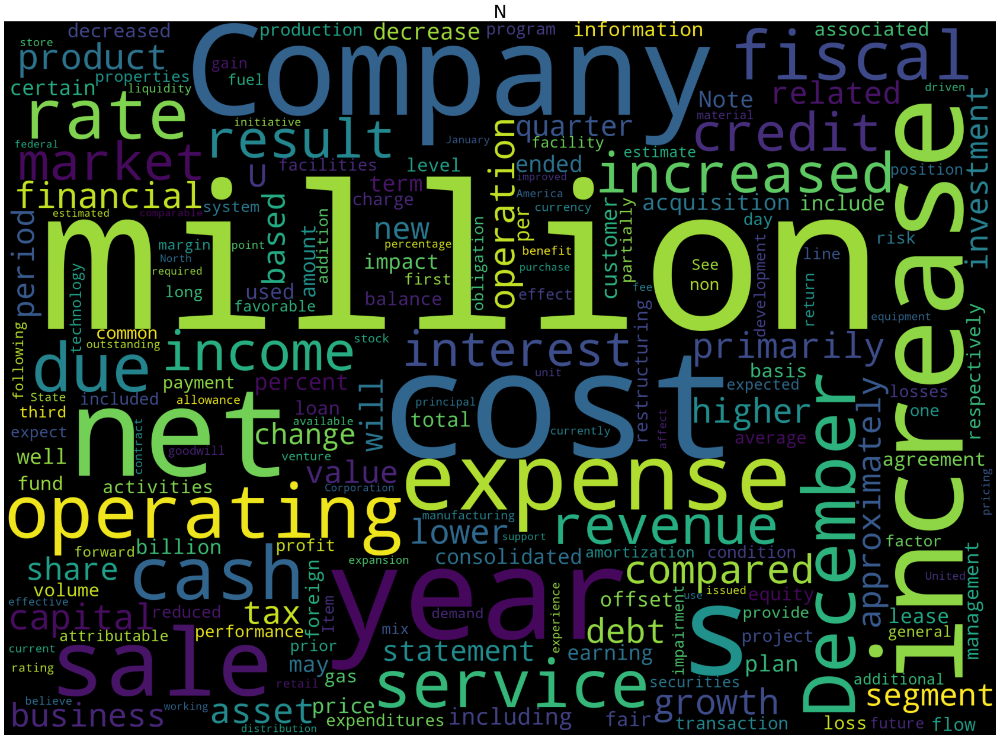

In [17]:
plt.figure(figsize=(30,25))
# N
subset = df[df.labels=='N']
text = subset['sentence']
cloud_N = WordCloud(stopwords=STOPWORDS, background_color='black', collocations=False, width=2500, height=1800).generate(" ".join(text))

plt.axis('off')
plt.title("N",fontsize=30)
plt.imshow(cloud_N)

## Sentence Max Length

In [20]:
# Return lower case of the input string
def lower(s):
    if isinstance(s, list):
        return [lower(t) for t in s]
    if isinstance(s, str):
        return s.lower()
    else:
        raise NotImplementedError("unknown datatype")

# Return a word list from a string of text with multiple sentences
def tokenize(text):
    return nltk.word_tokenize(text)

# Setup stemmer
ps = PorterStemmer()
# Return a list of stemmed words from a list of tokens
def stem(tokens):
    return [ps.stem(token) for token in tokens]

# Return a list of n-gram tokens given an input list of tokens
def n_gram(tokens, n=1):
    if n == 1:
        return tokens
    else:
        results = list()
        for i in range(len(tokens)-n+1):
            # tokens[i:i+n] will return a sublist from i th to i+n th (i+n th is not included)
            results.append(" ".join(tokens[i:i+n]))
        return results
    
# Setup stopwords set
stop_words = set(stopwords.words('english'))
# Return a list of filtered tokens given an input list of tokens
def filter_stopwords(tokens):
    return [token for token in tokens if token not in stop_words and not token.isnumeric()]

def get_feats_dict(feats, min_freq=-1, max_freq=-1, max_size=-1):
    """
    :param data: a list of features, type: list(list)
    :param min_freq: the lowest fequency that the fequency of a feature smaller than it will be filtered out
    :param max_freq: the highest fequency that the fequency of a feature larger than it will be filtered out
    :param max_size: the max size of feature dict
    return a feature dict that maps features to indices, sorted by frequencies
    # Counter document: https://docs.python.org/3.6/library/collections.html#collections.Counter
    """
    # count all features
    feat_cnt = Counter(feats) # ["text", "text", "mine"] --> {"text": 2, "mine": 1}
    if max_size > 0 and min_freq == -1 and max_freq == -1:
        valid_feats = [f for f, cnt in feat_cnt.most_common(max_size)]
    else:
        valid_feats = list()
        for f, cnt in feat_cnt.most_common():
            if (min_freq == -1 or cnt >= min_freq) and \
                (max_freq == -1 or cnt <= max_freq):
                valid_feats.append(f)
    if max_size > 0 and len(valid_feats) > max_size:
        valid_feats = valid_feats[:max_size]        
    print("Size of features:", len(valid_feats))
    
    # build a mapping from features to indices
    feats_dict = dict(zip(valid_feats, range(len(valid_feats))))
    return feats_dict

def get_onehot_vector(feats, feats_dict):
    # initialize the vector as all zeros
    vector = np.zeros(len(feats_dict), dtype=np.float)
    for f in feats:
        # get the feature index, return -1 if the feature is not existed
        f_idx = feats_dict.get(f, -1)
        if f_idx != -1:
            # set the corresponding element as 1
            vector[f_idx] = 1
    return vector

# Get index vector
def get_index_vector(feats, feats_dict, max_len):
    """
    :param feats: a list of features, type: list
    :param feats_dict: a dict from features to indices, type: dict
    :param feats: a list of features, type: list
    return a feature vector,
    """
    # initialize the vector as all zeros
    vector = np.zeros(max_len, dtype=np.int64)
    for i, f in enumerate(feats):
        if i == max_len:
            break
        # get the feature index, return 1 (<unk>) if the feature is not existed
        try:
            vector[i] = feats_dict[f]
        except KeyError:
            vector[i] = 1
    return vector

In [23]:
# load data
df_train, df_test, = train_test_split(df, stratify=df['labels'], test_size=0.1, random_state=42)
df_train, df_val = train_test_split(df_train, stratify=df_train['labels'],test_size=0.1, random_state=42)

train_texts = df_train.iloc[:, 0]
train_labels = df_train.iloc[:, 1]
valid_texts = df_val.iloc[:, 0]
valid_labels = df_val.iloc[:, 1]
test_texts = df_test.iloc[:, 0]
test_labels = df_test.iloc[:, 1]

train_size = len(train_texts)
valid_size = len(valid_texts)
test_size = len(test_texts)

In [28]:
# extract features
min_freq = 4

train_tokens = [tokenize(text) for text in train_texts]
valid_tokens = [tokenize(text) for text in valid_texts]

train_stemmed = [stem(tokens) for tokens in train_tokens]
valid_stemmed = [stem(tokens) for tokens in valid_tokens]

train_feats = [filter_stopwords(tokens) for tokens in train_stemmed]
valid_feats = [filter_stopwords(tokens) for tokens in valid_stemmed]

# build a mapping from features to indices
feats_dict = get_feats_dict(
    chain.from_iterable(train_feats),
    min_freq=min_freq)

Size of features: 2009


Text(0, 0.5, 'Cumulative Numbers')

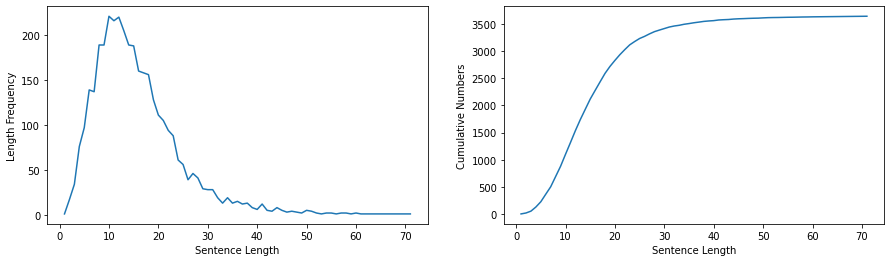

In [29]:
# find max sequency length
plt.figure(figsize=(15,4))
len_cnt = Counter([len(feats) for feats in train_feats])
len_key = sorted(len_cnt)
plt.subplot(1,2,1)
plt.plot(range(1, len(len_key)+1),
         [len_cnt[l] for l in len_key])
plt.xlabel("Sentence Length")
plt.ylabel("Length Frequency")

plt.subplot(1,2,2)
plt.plot(range(1, len(len_key)+1),
         np.cumsum([len_cnt[l] for l in len_key]))
plt.xlabel("Sentence Length")
plt.ylabel("Cumulative Numbers")

**Observation: set max_len = 75**